# Monthly trend maps of
- [ ] SST
- [ ] TCC
- [ ] LCC
- [ ] U10
- [ ] V10
- [ ] SSH
- [ ] EKE
- [ ] SW / LW / SH / LH

In [1]:
import xarray as xr
import json
import gcsfs
import numpy as np
import cmocean
import cartopy.crs as ccrs #cartopy coord ref sys
import cartopy
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib.colors import LogNorm
from matplotlib.colors import TwoSlopeNorm

In [2]:
sst_ds = xr.open_dataset('/work5/stb/ERA5/sst.nc', chunks={})
tcc_ds = xr.open_dataset('/work5/stb/ERA5/tcc.nc', chunks={})
mslp_ds = xr.open_dataset('/work5/stb/ERA5/mslp.nc', chunks={})
u10_ds = xr.open_dataset('/work5/stb/ERA5/u10.nc', chunks={})
v10_ds = xr.open_dataset('/work5/stb/ERA5/v10.nc', chunks={})
mask_ds = xr.open_dataset('/work5/stb/ERA5/mask.nc', chunks={})
lcc_ds = xr.open_dataset('/work/Shanice.Bailey/ERA5/lcc.nc', chunks={})

heat_fluxes = xr.open_dataset('/work/Shanice.Bailey/ERA5/era-heat-fluxes.nc', chunks={})

glorys = xr.open_dataset('glorys_vars.nc', chunks={})

/nbhome/Shanice.Bailey/conda/envs/bai/lib/python3.11/site-packages/xarray/backends/plugins.py:110: RuntimeWarning: Engine 'kerchunk' loading failed:
No module named 'zarr.core.array_spec'; 'zarr.core' is not a package
  external_backend_entrypoints = backends_dict_from_pkg(entrypoints_unique)


In [3]:
glorys

<xarray.Dataset> Size: 19GB
Dimensions:    (depth: 1, latitude: 169, longitude: 337, time: 10408)
Coordinates:
  * depth      (depth) float32 4B 0.494
  * latitude   (latitude) float32 676B 17.0 17.08 17.17 ... 30.83 30.92 31.0
  * longitude  (longitude) float32 1kB -100.0 -99.92 -99.83 ... -72.08 -72.0
  * time       (time) datetime64[ns] 83kB 1993-01-01 1993-01-02 ... 2021-06-30
Data variables:
    zos        (time, latitude, longitude) float64 5GB dask.array<chunksize=(10408, 169, 337), meta=np.ndarray>
    thetao     (time, depth, latitude, longitude) float64 5GB dask.array<chunksize=(10408, 1, 169, 337), meta=np.ndarray>
    uo         (time, depth, latitude, longitude) float64 5GB dask.array<chunksize=(10408, 1, 169, 337), meta=np.ndarray>
    vo         (time, depth, latitude, longitude) float64 5GB dask.array<chunksize=(10408, 1, 169, 337), meta=np.ndarray>
Attributes:
    institution:  MERCATOR OCEAN
    history:      2023/06/01 16:20:05 MERCATOR OCEAN Netcdf creation
    Conventions:  CF-1.4
    title:        daily mean fields from Global Ocean Physics Analysis and Fo...
    source:       MERCATOR GLORYS12V1
    references:   http://www.mercator-ocean.fr
    comment:      CMEMS product

In [4]:
heat_fluxes

<xarray.Dataset> Size: 1GB
Dimensions:    (longitude: 69, latitude: 55, time: 10408)
Coordinates:
  * longitude  (longitude) float32 276B 262.0 262.2 262.5 ... 278.5 278.8 279.0
  * latitude   (latitude) float32 220B 31.0 30.75 30.5 30.25 ... 18.0 17.75 17.5
  * time       (time) datetime64[ns] 83kB 1993-01-01 1993-01-02 ... 2021-06-30
Data variables:
    ssr        (time, latitude, longitude) float64 316MB dask.array<chunksize=(10408, 55, 69), meta=np.ndarray>
    str        (time, latitude, longitude) float64 316MB dask.array<chunksize=(10408, 55, 69), meta=np.ndarray>
    sshf       (time, latitude, longitude) float64 316MB dask.array<chunksize=(10408, 55, 69), meta=np.ndarray>
    slhf       (time, latitude, longitude) float64 316MB dask.array<chunksize=(10408, 55, 69), meta=np.ndarray>
Attributes:
    units:          J m**-2
    long_name:      Surface net short-wave (solar) radiation
    standard_name:  surface_net_downward_shortwave_flux

In [5]:
time_slice = dict(time=slice('2004', '2012'))
gom = dict(longitude=slice(-98, -81), latitude=slice(17.5, 31))

glorys_gom = glorys.sel(**gom).isel(depth=0).drop_vars('depth').sel(**time_slice)
sst = sst_ds.sea_surface_temperature.sel(**time_slice)
tcc = tcc_ds.total_cloud_cover.sel(**time_slice)
mslp = mslp_ds.mean_sea_level_pressure.sel(**time_slice)
u10 = u10_ds['10m_u_component_of_wind'].sel(**time_slice)
v10 = v10_ds['10m_v_component_of_wind'].sel(**time_slice)
mask = mask_ds.land_sea_mask
lcc = lcc_ds.lcc.sel(**time_slice)

sw = heat_fluxes.ssr.sel(**time_slice) / (60*60) #W/m2
lw = heat_fluxes.str.sel(**time_slice) / (60*60) #W/m2
sh = heat_fluxes.sshf.sel(**time_slice) / (60*60) #W/m2
lh = heat_fluxes.slhf.sel(**time_slice) / (60*60) #W/m2

sst_g = glorys_gom.thetao
ssh = glorys_gom.zos
u = glorys_gom.uo
v = glorys_gom.vo
eke = 0.5 * (u**2 + v**2)

In [6]:
sst

<xarray.DataArray 'sea_surface_temperature' (time: 78912, latitude: 55,
                                             longitude: 69)> Size: 1GB
dask.array<getitem, shape=(78912, 55, 69), dtype=float32, chunksize=(78912, 55, 69), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 220B 31.0 30.75 30.5 30.25 ... 18.0 17.75 17.5
  * longitude  (longitude) float32 276B 262.0 262.2 262.5 ... 278.5 278.8 279.0
  * time       (time) datetime64[ns] 631kB 2004-01-01 ... 2012-12-31T23:00:00

In [7]:
sst_g

<xarray.DataArray 'thetao' (time: 3288, latitude: 163, longitude: 205)> Size: 879MB
dask.array<getitem, shape=(3288, 163, 205), dtype=float64, chunksize=(3288, 163, 205), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 652B 17.5 17.58 17.67 ... 30.83 30.92 31.0
  * longitude  (longitude) float32 820B -98.0 -97.92 -97.83 ... -81.08 -81.0
  * time       (time) datetime64[ns] 26kB 2004-01-01 2004-01-02 ... 2012-12-31
Attributes:
    long_name:      Temperature
    units:          degrees_C
    valid_max:      21306
    valid_min:      -32766
    standard_name:  sea_water_potential_temperature
    unit_long:      Degrees Celsius

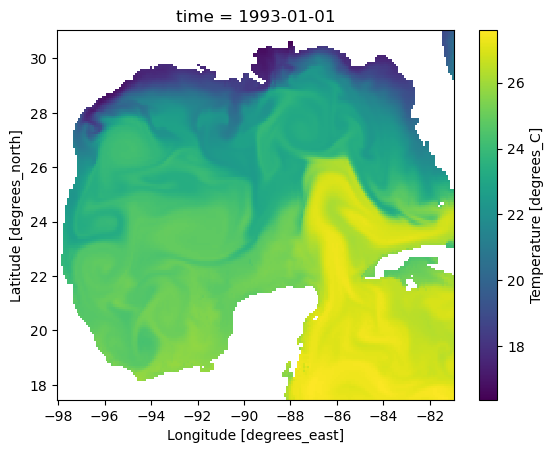

In [14]:
sst_g[0].plot()

In [8]:
#make a list of empty data arrays for each month
mo_list = ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sept', 'octo', 'nov', 'dec']

sst_months = []
[sst_months.append(xr.DataArray().rename(i)) for i in mo_list]

tcc_months = []
[tcc_months.append(xr.DataArray().rename(i)) for i in mo_list]

u10_months = []
[u10_months.append(xr.DataArray().rename(i)) for i in mo_list]

v10_months = []
[v10_months.append(xr.DataArray().rename(i)) for i in mo_list]

mslp_months = []
[mslp_months.append(xr.DataArray().rename(i)) for i in mo_list]

lcc_months = []
[lcc_months.append(xr.DataArray().rename(i)) for i in mo_list]

sw_months = []
[sw_months.append(xr.DataArray().rename(i)) for i in mo_list]

lw_months = []
[lw_months.append(xr.DataArray().rename(i)) for i in mo_list]

sh_months = []
[sh_months.append(xr.DataArray().rename(i)) for i in mo_list]

lh_months = []
[lh_months.append(xr.DataArray().rename(i)) for i in mo_list]

ssh_months = []
[ssh_months.append(xr.DataArray().rename(i)) for i in mo_list]

u_months = []
[u_months.append(xr.DataArray().rename(i)) for i in mo_list]

v_months = []
[v_months.append(xr.DataArray().rename(i)) for i in mo_list]

eke_months = []
[eke_months.append(xr.DataArray().rename(i)) for i in mo_list]

sst_g_months = []
[sst_g_months.append(xr.DataArray().rename(i)) for i in mo_list]

[None, None, None, None, None, None, None, None, None, None, None, None]

In [9]:
#populate each month data array w var's values for each corresponding month
#e.g. take all the Januaries and put them in their own DataArray
for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
    sst_months[i] = sst.sel(time=sst['time.month']==j)

for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
    u10_months[i] = u10.sel(time=u10['time.month']==j)

for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
    v10_months[i] = v10.sel(time=v10['time.month']==j)

for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
    tcc_months[i] = tcc.sel(time=tcc['time.month']==j)

for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
    mslp_months[i] = tcc.sel(time=mslp['time.month']==j)

for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
    lcc_months[i] = lcc.sel(time=lcc['time.month']==j)

for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
    sw_months[i] = sw.sel(time=sw['time.month']==j)

for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
    lw_months[i] = lw.sel(time=lw['time.month']==j)

for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
    sh_months[i] = sh.sel(time=sh['time.month']==j)

for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
    lh_months[i] = lh.sel(time=lh['time.month']==j)

for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
    ssh_months[i] = ssh.sel(time=ssh['time.month']==j)

for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
    u_months[i] = u.sel(time=u['time.month']==j)

for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
    v_months[i] = v.sel(time=v['time.month']==j)

for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
    eke_months[i] = eke.sel(time=eke['time.month']==j)

for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
    sst_g_months[i] = sst_g.sel(time=eke['time.month']==j)

## Calculate monthly trends

In [10]:
from scipy.stats import linregress

In [11]:
trend_sst = []
for i in np.arange(0,len(sst_months)):
    trend_sst.append(sst_months[i].groupby('time.year').mean('time').polyfit('year', deg=1)) #˚C/yr

trend_u10 = []
for i in np.arange(0,len(u10_months)):
    trend_u10.append(u10_months[i].groupby('time.year').mean('time').polyfit('year', deg=1)) #m/s/yr

trend_v10 = []
for i in np.arange(0,len(v10_months)):
    trend_v10.append(v10_months[i].groupby('time.year').mean('time').polyfit('year', deg=1)) #m/s/yr

trend_tcc = []
for i in np.arange(0,len(tcc_months)):
    trend_tcc.append(tcc_months[i].groupby('time.year').mean('time').polyfit('year', deg=1)) #0-1/yr

trend_mslp = []
for i in np.arange(0,len(mslp_months)):
    trend_mslp.append(mslp_months[i].groupby('time.year').mean('time').polyfit('year', deg=1)) #Pa/yr

trend_lcc = []
for i in np.arange(0,len(lcc_months)):
    trend_lcc.append(lcc_months[i].groupby('time.year').mean('time').polyfit('year', deg=1)) #/yr

trend_sw = []
for i in np.arange(0,len(sw_months)):
    trend_sw.append(sw_months[i].groupby('time.year').mean('time').polyfit('year', deg=1)) #/yr

trend_lw = []
for i in np.arange(0,len(lw_months)):
    trend_lw.append(lw_months[i].groupby('time.year').mean('time').polyfit('year', deg=1)) #/yr

trend_sh = []
for i in np.arange(0,len(sh_months)):
    trend_sh.append(sh_months[i].groupby('time.year').mean('time').polyfit('year', deg=1)) #/yr

trend_lh = []
for i in np.arange(0,len(lh_months)):
    trend_lh.append(lh_months[i].groupby('time.year').mean('time').polyfit('year', deg=1)) #/yr

trend_ssh = []
for i in np.arange(0,len(ssh_months)):
    trend_ssh.append(ssh_months[i].groupby('time.year').mean('time').polyfit('year', deg=1)) #m/yr

trend_u = []
for i in np.arange(0,len(u_months)):
    trend_u.append(u_months[i].groupby('time.year').mean('time').polyfit('year', deg=1)) #m/s/yr

trend_v = []
for i in np.arange(0,len(v_months)):
    trend_v.append(v_months[i].groupby('time.year').mean('time').polyfit('year', deg=1)) #m/s/yr

trend_eke = []
for i in np.arange(0,len(eke_months)):
    trend_eke.append(eke_months[i].groupby('time.year').mean('time').polyfit('year', deg=1)) #m2/s2/yr

trend_sst_g = []
for i in np.arange(0,len(sst_g_months)):
    trend_sst_g.append(sst_g_months[i].groupby('time.year').mean('time').polyfit('year', deg=1)) #˚C/yr

In [12]:
trend_ssh[0]

<xarray.Dataset> Size: 536kB
Dimensions:               (degree: 2, latitude: 163, longitude: 205)
Coordinates:
  * degree                (degree) int64 16B 1 0
  * longitude             (longitude) float32 820B -98.0 -97.92 ... -81.08 -81.0
  * latitude              (latitude) float32 652B 17.5 17.58 ... 30.92 31.0
Data variables:
    polyfit_coefficients  (degree, latitude, longitude) float64 535kB dask.array<chunksize=(2, 163, 205), meta=np.ndarray>

## Trend maps of each month for each variable (2004-2012)

In [12]:
def plot_trend(da, title, cbar_label, v_min, v_max, cmap_choice, diverge=True):
    proj = ccrs.Mercator() #with Mercator you can put lat lon values.
    fig, ax = plt.subplots(figsize=(15, 15), subplot_kw=dict(projection=proj))
    
    ax.set_extent([-98, -81, 17.5, 31], crs=ccrs.PlateCarree())
    
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m',
                                            edgecolor='face',
                                            facecolor='0.5'))
    if diverge==True:
        d = da.polyfit_coefficients[0]
        norm = TwoSlopeNorm(vmin=v_min, vcenter=0, vmax=v_max)
        im = ax.pcolormesh(d.longitude, d.latitude, d, transform=ccrs.PlateCarree(), 
                           norm=norm, cmap=cmap_choice)
        cb = fig.colorbar(im, ax=ax, shrink=0.4)
        cb.set_label(fr"{cbar_label}", labelpad=12, fontsize=20)
        
        g1 = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True)
        g1.xlabels_top = False
        g1.ylabels_right = False
        
        plt.title(f'{title}', fontsize=26);
    else:
        d = da.polyfit_coefficients[0]
        im = ax.pcolormesh(d.longitude, d.latitude, d, transform=ccrs.PlateCarree(), 
                           vmin=v_min, vmax=v_max, cmap=cmap_choice)
        cb = fig.colorbar(im, ax=ax, shrink=0.4)
        cb.set_label(fr"{cbar_label}", labelpad=12, fontsize=20)
        
        g1 = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True)
        g1.xlabels_top = False
        g1.ylabels_right = False
        
        plt.title(f'{title}', fontsize=26);

In [13]:
mo_titles = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

def plotting_func(trend_da, units, title, suptitle, v_min, v_max, cmap_choice, diverge=True):
    proj = ccrs.Mercator() #with Mercator you can put lat lon values.
    fig, ax = plt.subplots(3, 4, figsize=(30, 20), subplot_kw=dict(projection=proj))

    ax = ax.ravel()
    for (i,j,k) in zip(np.arange(0,12), np.arange(0,len(trend_da)), mo_titles):
        ax[i].set_extent([-98, -81, 17.5, 31], crs=ccrs.PlateCarree())
        ax[i].add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m',
                                                         edgecolor='face', facecolor='0.5'))
        if diverge==True:
            da = trend_da[j].polyfit_coefficients[0]
            norm = TwoSlopeNorm(vmin=v_min, vcenter=0, vmax=v_max)
            im = ax[i].pcolormesh(da.longitude, da.latitude, da, transform=ccrs.PlateCarree(), 
                               cmap=cmap_choice, norm=norm)
            cb = plt.colorbar(im, ax=ax[i], shrink=0.7, extend='both')
            cb.ax.set_title(f"{units}", fontsize=10)# labelpad=2, loc='top')
            
            g1 = ax[i].gridlines(crs=ccrs.PlateCarree(), draw_labels=True)
            g1.xlabels_top = False
            g1.ylabels_right = False
    
            left, width = .05, .5
            bottom, height = .25, .73
            right = left + width
            top = bottom + height
            #ax[i].set_title(f'{k}', horizontalalignment='left', verticalalignment='top', fontsize=26)
            ax[i].text(left, top, f'{k}', horizontalalignment='left', verticalalignment='top', 
                       fontsize=26, transform=ax[i].transAxes, color='white')
        else:
            da = trend_da[j].polyfit_coefficients[0]
            im = ax[i].pcolormesh(da.longitude, da.latitude, da, transform=ccrs.PlateCarree(), 
                               cmap=cmap_choice, vmin=v_min, vmax=v_max)
            cb = plt.colorbar(im, ax=ax[i], shrink=0.7, extend='both')
            cb.ax.set_title(f"{units}", fontsize=10)# labelpad=2, loc='top')
            
            g1 = ax[i].gridlines(crs=ccrs.PlateCarree(), draw_labels=True)
            g1.xlabels_top = False
            g1.ylabels_right = False
    
            left, width = .05, .5
            bottom, height = .25, .73
            right = left + width
            top = bottom + height
            #ax[i].set_title(f'{k}', horizontalalignment='left', verticalalignment='top', fontsize=26)
            ax[i].text(left, top, f'{k}', horizontalalignment='left', verticalalignment='top', 
                       fontsize=26, transform=ax[i].transAxes, color='white')
            
        plt.tight_layout()
        plt.suptitle(f'{suptitle}', y=1, fontweight='bold', fontsize=20);

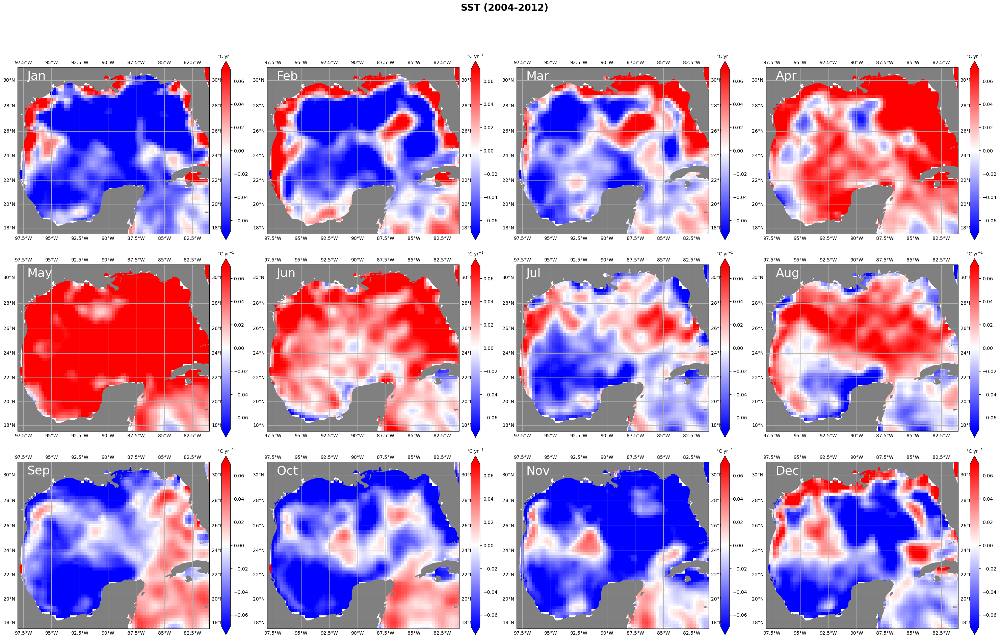

In [22]:
plotting_func(trend_sst, units=r'$^{\circ}$C yr$^{-1}$', title=mo_titles, 
              suptitle='SST (2004-2012)', v_min=-0.07, v_max=0.07, cmap_choice='bwr')

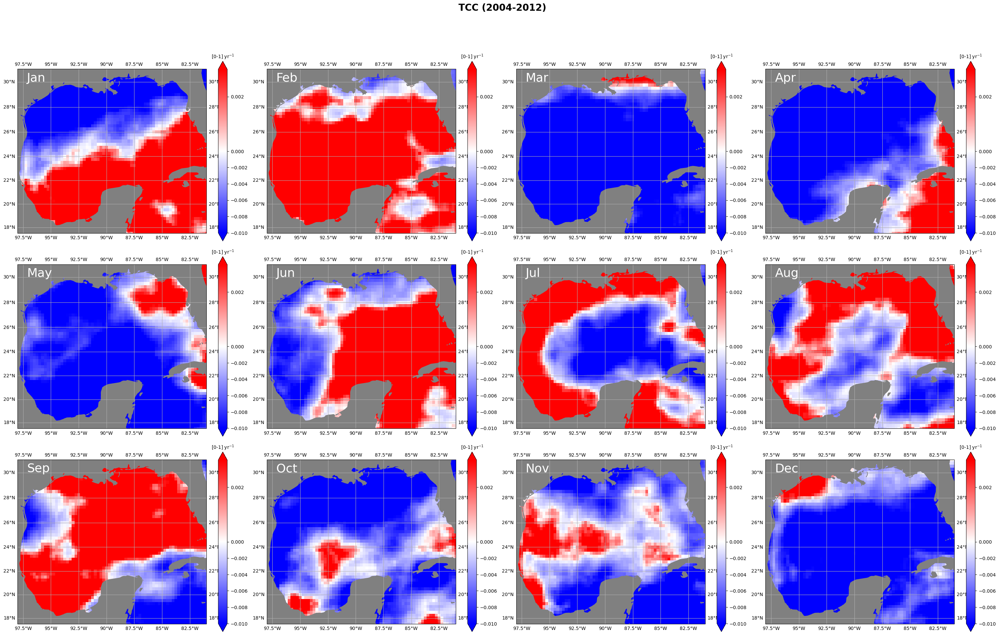

In [24]:
plotting_func(trend_tcc, units=r'[0-1] yr$^{-1}$', title=mo_titles, 
              suptitle='TCC (2004-2012)', v_min=-0.01, v_max=0.003, cmap_choice='bwr')

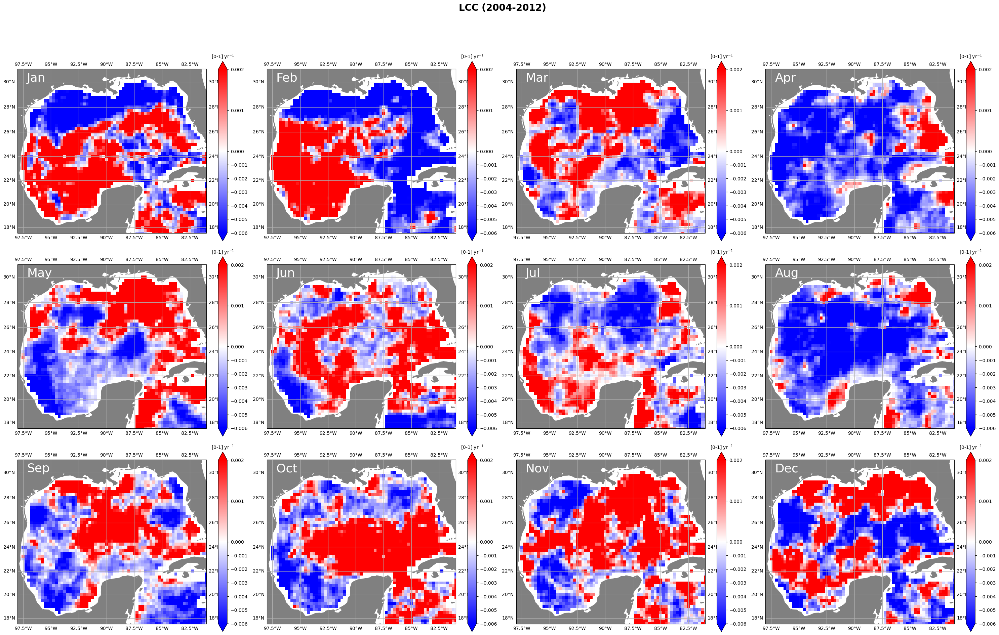

In [25]:
plotting_func(trend_lcc, units=r'[0-1] yr$^{-1}$', title=mo_titles, 
              suptitle='LCC (2004-2012)', v_min=-0.006, v_max=0.002, cmap_choice='bwr')

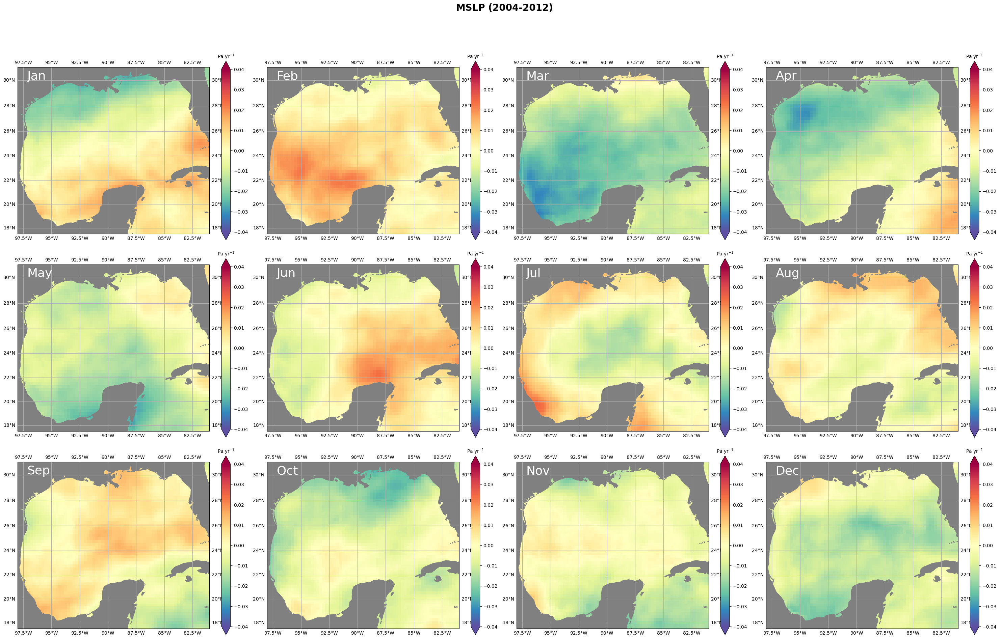

In [41]:
plotting_func(trend_mslp, units=r'Pa yr$^{-1}$', title=mo_titles, 
              suptitle='MSLP (2004-2012)', v_min=-.04, v_max=0.04, cmap_choice='Spectral_r', diverge=False)

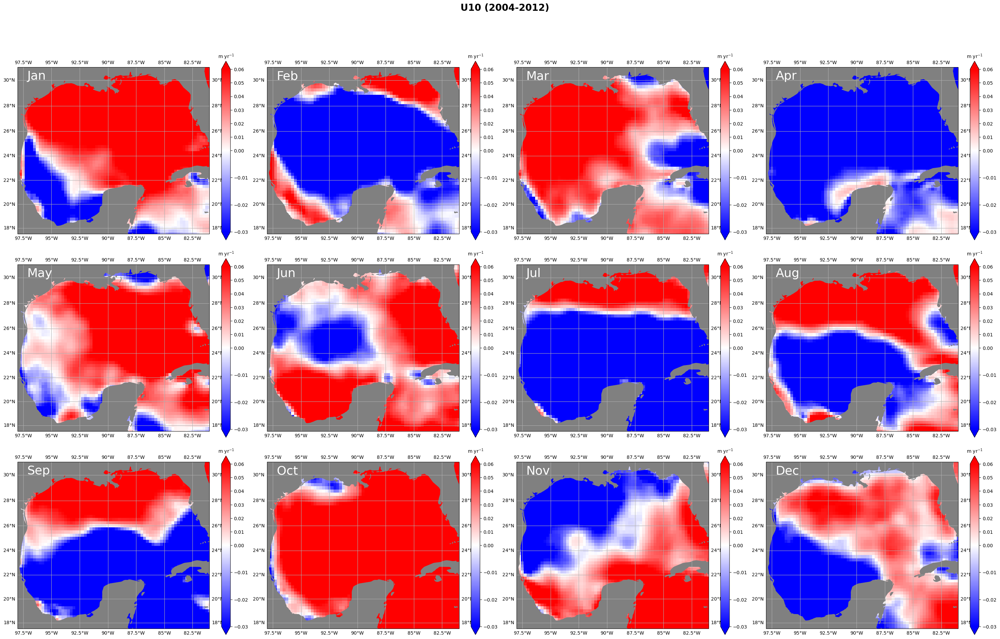

In [39]:
plotting_func(trend_u10, units=r'm yr$^{-1}$', title=mo_titles, 
              suptitle='U10 (2004-2012)', v_min=-0.03, v_max=0.06, cmap_choice='bwr')

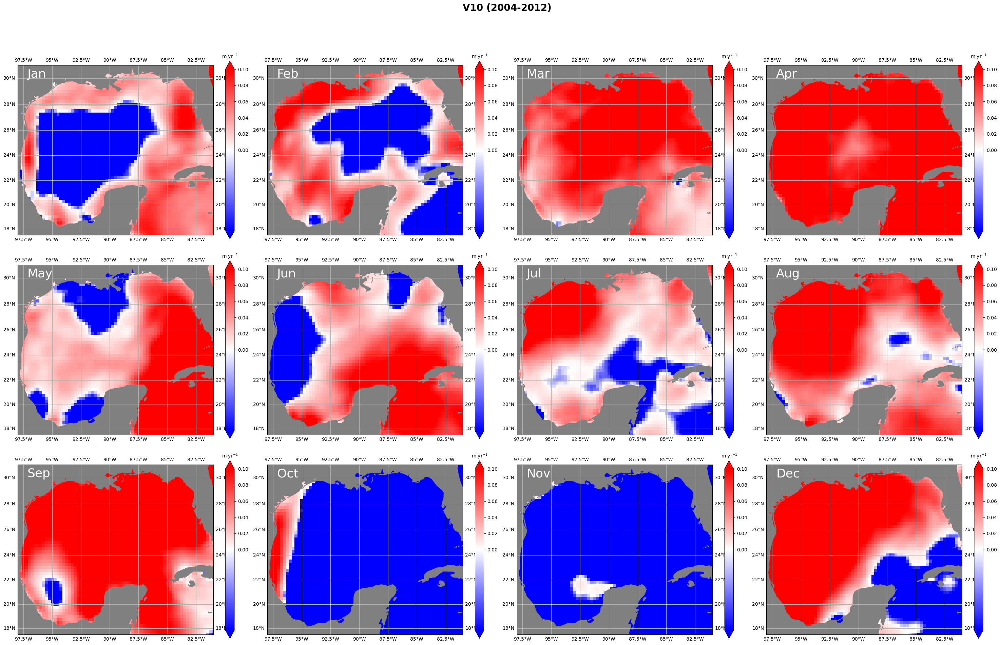

In [40]:
plotting_func(trend_v10, units=r'm yr$^{-1}$', title=mo_titles, 
              suptitle='V10 (2004-2012)', v_min=-0.01, v_max=0.1, cmap_choice='bwr')

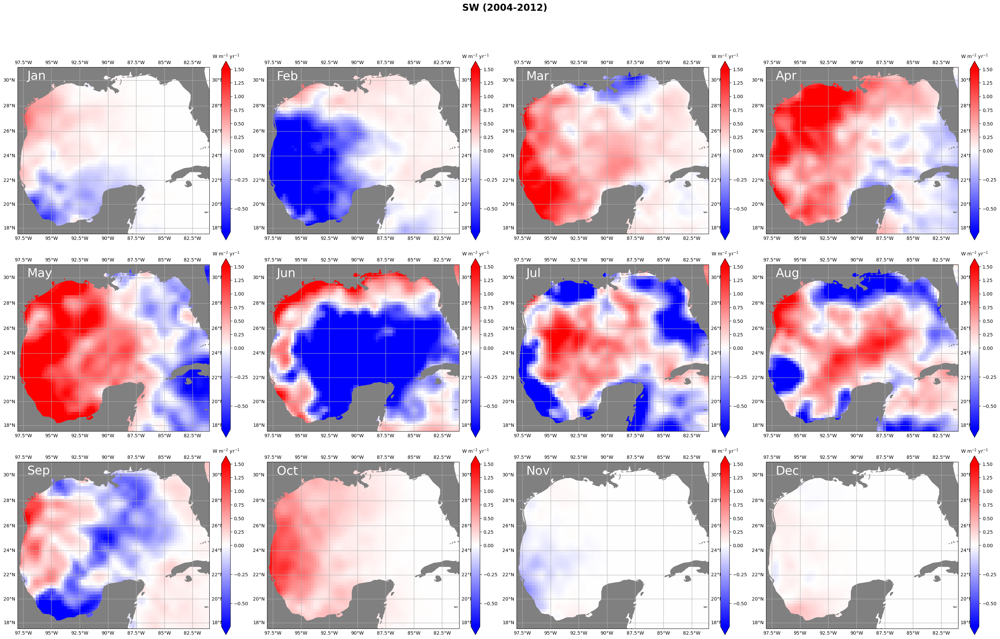

In [16]:
plotting_func(trend_sw, units=r'W m$^{-2}$ yr$^{-1}$', title=mo_titles, 
              suptitle='SW (2004-2012)', v_min=-0.7, v_max=1.5, cmap_choice='bwr')

In [ ]:
plotting_func(trend_lw, units=r'W m$^{-2}$ yr$^{-1}$', title=mo_titles, 
              suptitle='LW (2004-2012)', v_min=-1.6, v_max=0.6, cmap_choice='bwr')

In [ ]:
plotting_func(trend_sh, units=r'W m$^{-2}$ yr$^{-1}$', title=mo_titles, 
              suptitle='SH (2004-2012)', v_min=-3, v_max=1, cmap_choice='bwr')

In [ ]:
plotting_func(trend_lh, units=r'W m$^{-2}$ yr$^{-1}$', title=mo_titles, 
              suptitle='LH (2004-2012)', v_min=-3, v_max=3, cmap_choice='bwr')

### GLORYS

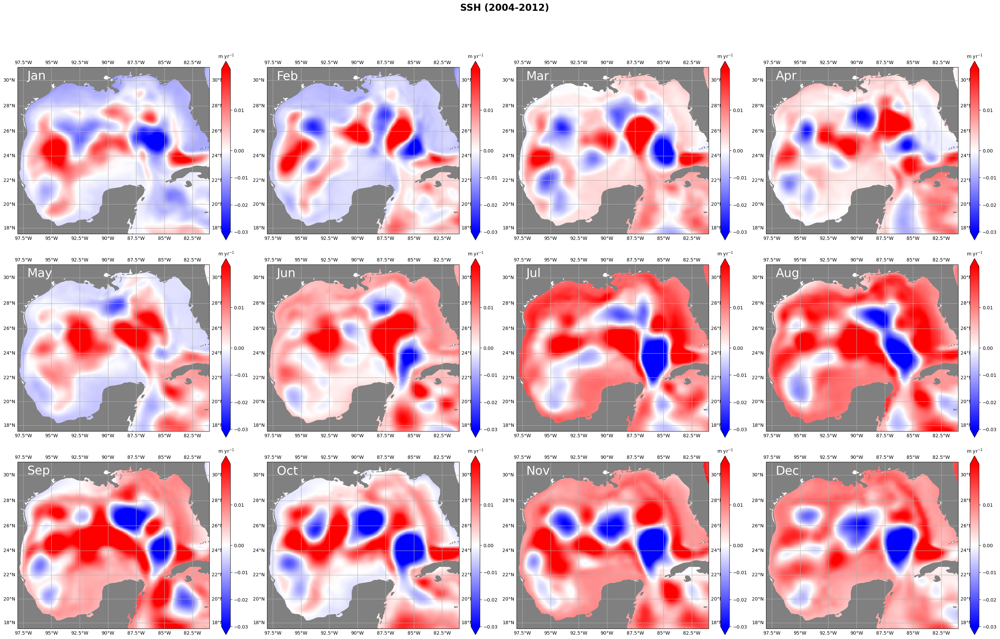

In [42]:
plotting_func(trend_ssh, units=r'm yr$^{-1}$', title=mo_titles, 
              suptitle='SSH (2004-2012)', v_min=-0.03, v_max=0.02, cmap_choice='bwr')

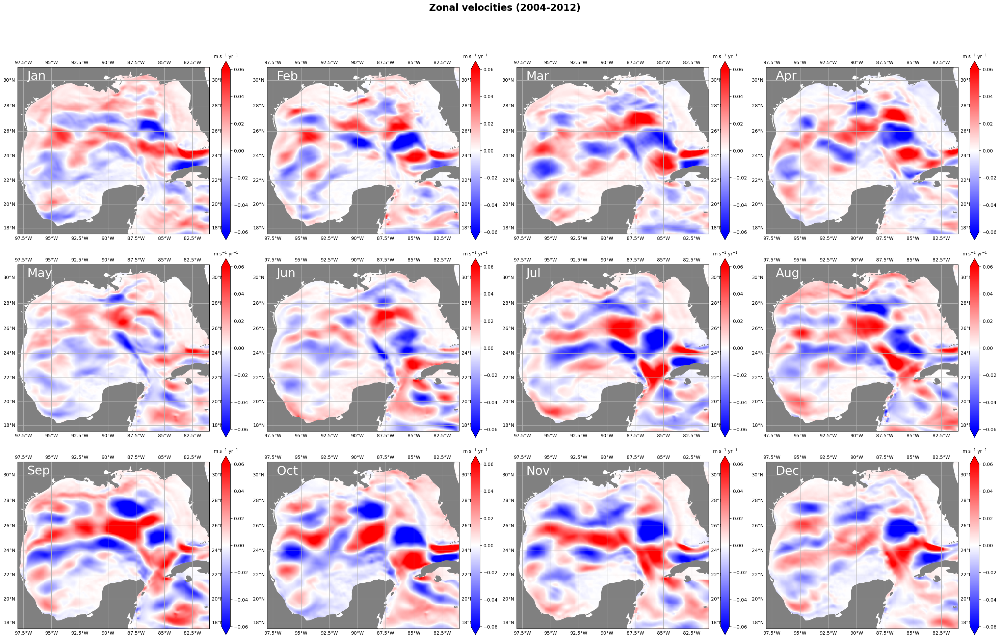

In [43]:
plotting_func(trend_u, units=r'm s$^{-1}$ yr$^{-1}$', title=mo_titles, 
              suptitle='Zonal velocities (2004-2012)', v_min=-0.06, v_max=0.06, cmap_choice='bwr')

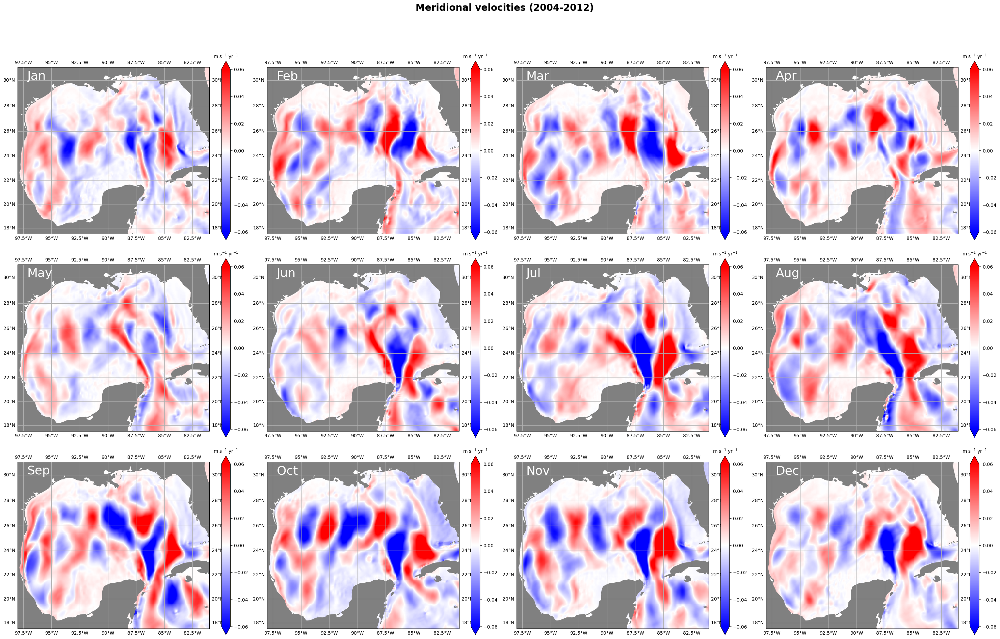

In [44]:
plotting_func(trend_v, units=r'm s$^{-1}$ yr$^{-1}$', title=mo_titles, 
              suptitle='Meridional velocities (2004-2012)', v_min=-0.06, v_max=0.06, cmap_choice='bwr')

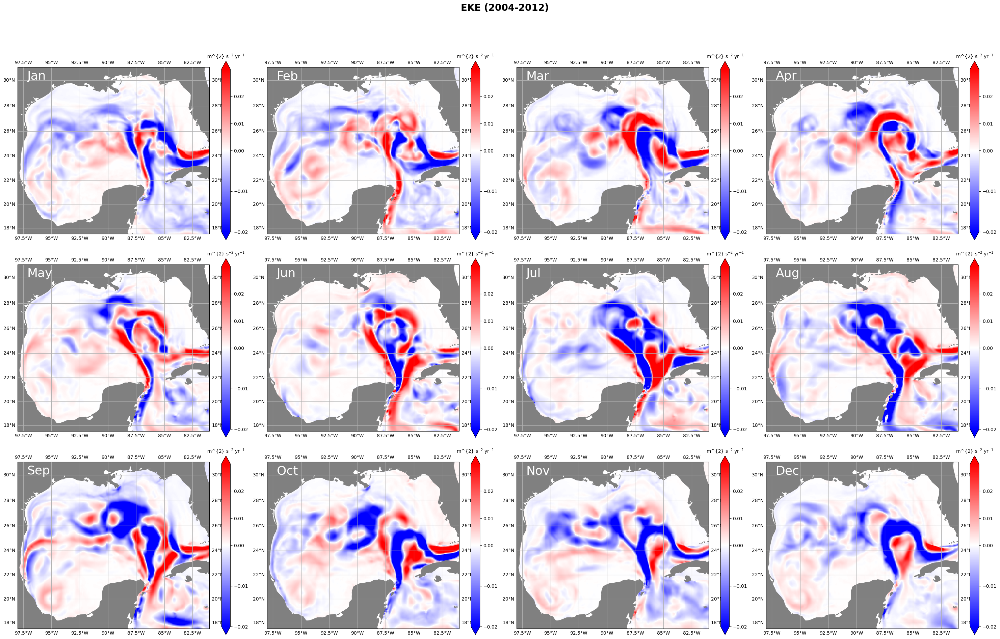

In [14]:
plotting_func(trend_eke, units=r'm^{2} s$^{-2}$ yr$^{-1}$', title=mo_titles, 
              suptitle='EKE (2004-2012)', v_min=-0.02, v_max=0.03, cmap_choice='bwr')

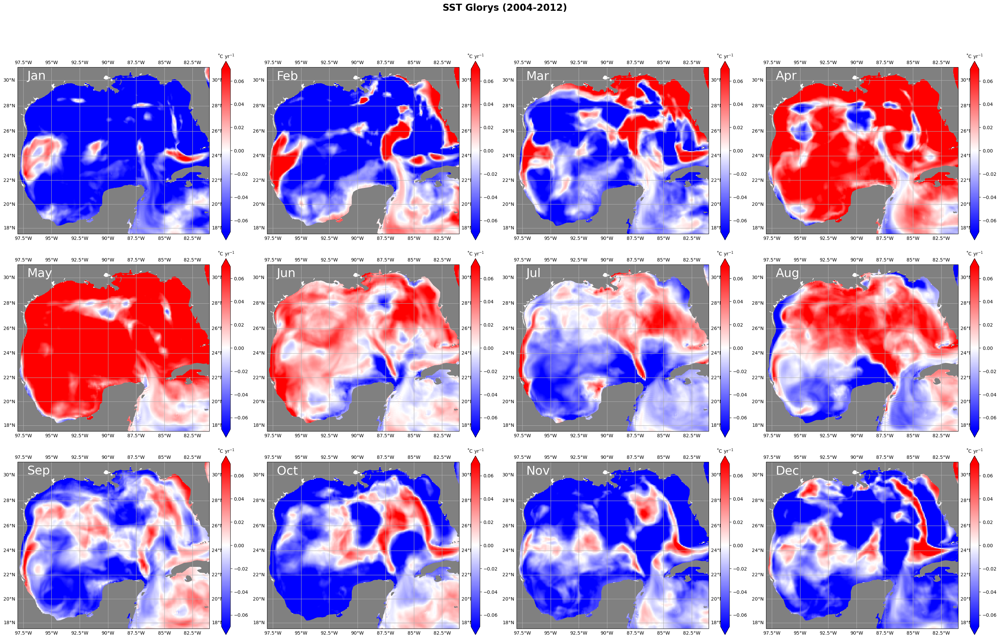

In [15]:
plotting_func(trend_sst_g, units=r'˚C yr$^{-1}$', title=mo_titles, 
              suptitle='SST Glorys (2004-2012)', v_min=-0.07, v_max=0.07, cmap_choice='bwr')